<a href="https://colab.research.google.com/github/Pramuuu/Futurense_ML/blob/main/13_07_2024_eda_analysis_b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# importing requirement libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

# for solving problem of show plotly plots
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
# Optional
# for filter warnings
import warnings
warnings.filterwarnings('ignore')
# for better plot visualization
plt.style.use('_mpl-gallery')
FONT = {'fontsize':20, 'fontstyle':'normal', 'fontfamily':'Times New Roman', 'backgroundcolor':'#145A32', 'color':'orange'} # for plot title

In [3]:
# importing requirement sklearn functions
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, cross_val_score, train_test_split, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB, ComplementNB, BernoulliNB, CategoricalNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, jaccard_score, log_loss

In [4]:
data = pd.read_csv('/content/finalcloan.csv')
df = pd.DataFrame(data)
df

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),...,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Dependents_zscore,Property Age_zscore,Credit_Score_zscore,current_loan_expenses_zscore
0,C-26247,Tandra Olszewski,F,47,3472.69,Low,Commercial associate,Managers,Semi-Urban,137088.98,...,843,3472.69,2,Urban,1,236644.5,0.255453,0.691140,0.833053,0.054401
1,C-35067,Jeannette Cha,F,57,1184.84,Low,Working,Sales staff,Rural,104771.59,...,22,1184.84,1,Rural,1,142357.3,0.255453,0.968816,1.304972,0.256190
2,C-34590,Keva Godfrey,F,52,1266.27,Low,Working,Other,Semi-Urban,176684.91,...,1,1266.27,1,Urban,1,300991.24,0.822862,0.909734,1.538281,0.392351
3,C-16668,Elva Sackett,M,65,1369.72,High,Pensioner,Other,Rural,97009.18,...,730,1369.72,1,Semi-Urban,0,125612.1,0.255453,0.834676,1.303453,0.174604
4,C-12196,Sade Constable,F,60,1939.23,High,Pensioner,Other,Urban,109980.00,...,356,1939.23,4,Semi-Urban,1,180908,0.255453,0.421466,NaN,0.177730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,C-9076,Tobias Davilla,F,19,1349.60,Low,Commercial associate,Other,Semi-Urban,156766.97,...,681,1349.60,4,Semi-Urban,1,212778,1.901176,0.849274,0.752716,0.426820
19996,C-17587,Evelina Hodges,M,22,2019.78,Low,Working,Core staff,Urban,47924.80,...,213,2019.78,4,Urban,1,90816.95,0.255453,0.363023,0.448600,0.766481
19997,C-46479,Karlyn Mckinzie,M,19,2252.03,Low,Working,Core staff,Semi-Urban,18629.88,...,270,2252.03,2,Rural,0,21566.27,1.333767,0.194513,1.137488,1.420372
19998,C-3099,Mariana Pulver,F,21,1845.35,Low,Working,Other,Semi-Urban,95430.73,...,489,1845.35,1,Semi-Urban,1,120281.17,0.255453,0.489581,1.748993,0.635416


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Customer ID                   20000 non-null  object 
 1   Name                          20000 non-null  object 
 2   Gender                        20000 non-null  object 
 3   Age                           20000 non-null  int64  
 4   Income (USD)                  20000 non-null  float64
 5   Income Stability              20000 non-null  object 
 6   Profession                    20000 non-null  object 
 7   Type of Employment            20000 non-null  object 
 8   Location                      20000 non-null  object 
 9   Loan Amount Request (USD)     20000 non-null  float64
 10  Current Loan Expenses (USD)   20000 non-null  float64
 11  Expense Type 1                20000 non-null  object 
 12  Expense Type 2                20000 non-null  object 
 13  D

In [6]:
   !pip install ydata-profiling
   from ydata_profiling import ProfileReport

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=4384cd4fc1faf53ea6cfd08dbbddac953f74b49912c0a7d0c06debaa66169728
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [7]:
   profile = ProfileReport(df)
   profile.to_file("report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import KBinsDiscretizer, OneHotEncoder, StandardScaler
from sklearn.naive_bayes import ComplementNB, BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.metrics import classification_report, RocCurveDisplay, ConfusionMatrixDisplay
from scipy import stats
from sklearn.base import clone
%matplotlib inline

In [10]:
# Define a colormap
royalblue = LinearSegmentedColormap.from_list('royalblue', [(0, (1,1,1)), (1, (0.25,0.41,0.88))])
royalblue_r = royalblue.reversed()

In [11]:
# Calculation of the Spearman correlation
target = 'Loan Amount Request (USD)'
df_ordered = pd.concat([df.drop(target,axis=1), df[target]],axis=1)
corr = df_ordered.corr(method='spearman')

# Create a mask so that we see the correlation values only once
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask,1)] = True

# Plot the heatmap correlation
plt.figure(figsize=(12,8), dpi=80)
sns.heatmap(corr, mask=mask, annot=True, cmap=royalblue, fmt='.2f', linewidths=0.2)
plt.show()

ValueError: could not convert string to float: 'C-26247'

In [ ]:
spearman_corr = df.corr(method='spearman')
print("Spearman Correlation:\n", spearman_corr)

ValueError: could not convert string to float: 'C-26247'

In [ ]:
df_subset = df[['Age', 'Income Stability']]

In [ ]:
pearson_corr = df_subset.corr(method='pearson')
print("Pearson Correlation:\n", pearson_corr)

ValueError: could not convert string to float: 'Low'

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
data = pd.read_csv('/content/finalcloan.csv')
df = pd.DataFrame(data)
# Convert categorical 'Income Stability' to numeric using LabelEncoder
label_encoder = LabelEncoder()
df['Income Stability'] = label_encoder.fit_transform(df['Income Stability'])

# Calculate Pearson and Spearman correlations
pearson_corr = df.corr(method='pearson')
spearman_corr = df.corr(method='spearman')

# Print the correlation matrices
print("Pearson Correlation:\n", pearson_corr)
print("Spearman Correlation:\n", spearman_corr)

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['Age'], df['Income Stability'], alpha=0.5)
plt.title('Scatter Plot of Age vs. Income Stability')
plt.xlabel('Age')
plt.ylabel('Income Stability')
plt.grid(True)
plt.show()

# Heatmaps
plt.figure(figsize=(6, 4))
sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Pearson Correlation Heatmap')
plt.show()

plt.figure(figsize=(6, 4))
sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Spearman Correlation Heatmap')
plt.show()

ValueError: could not convert string to float: 'C-26247'

In [ ]:
import pandas as pd
import scipy.stats as stats

# Assuming 'data.csv' contains 'age' and 'income_stability'


# Perform one-way ANOVA
anova_result = stats.f_oneway(
    data[data['income_stability'] == 'Low']['age'],
    data[data['income_stability'] == 'Medium']['age'],
    data[data['income_stability'] == 'High']['age']
)

print(f'ANOVA F-value: {anova_result.statistic}, p-value: {anova_result.pvalue}')

In [12]:
pd.set_option('display.max_rows', 20) # for show all rows
round(df.describe().T, 2)

,count,mean,std,min,25%,50%,75%,max
Age,20000.0,39.94,16.10,18.00,25.00,40.00,55.00,65.00
Income (USD),20000.0,2525.28,1390.37,368.59,1678.36,2224.59,3047.98,30427.68
Loan Amount Request (USD),20000.0,88859.08,60007.33,6185.48,40889.03,74565.99,120068.85,576335.68
Current Loan Expenses (USD),20000.0,408.32,215.41,41.37,251.34,374.00,518.79,3305.97
Dependents,20000.0,2.24,0.93,1.00,2.00,2.00,3.00,13.00
Credit Score,20000.0,738.82,71.05,580.04,682.49,738.82,795.21,893.83
No. of Defaults,20000.0,0.19,0.39,0.00,0.00,0.00,0.00,1.00
Property ID,20000.0,501.02,287.54,1.00,252.00,501.00,748.00,999.00
Property Age,20000.0,2520.12,1378.26,368.59,1681.23,2220.60,3040.52,30427.68
Property Type,20000.0,2.47,1.13,1.00,1.00,2.00,3.00,4.00


In [14]:
# convert annual income to monthly with divide by 12
df['Income (USD)'] = round(df['Income (USD)']/12, 2)
df

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),...,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Dependents_zscore,Property Age_zscore,Credit_Score_zscore,current_loan_expenses_zscore
0,C-26247,Tandra Olszewski,F,47,24.12,Low,Commercial associate,Managers,Semi-Urban,137088.98,...,843,3472.69,2,Urban,1,236644.5,0.255453,0.691140,0.833053,0.054401
1,C-35067,Jeannette Cha,F,57,8.23,Low,Working,Sales staff,Rural,104771.59,...,22,1184.84,1,Rural,1,142357.3,0.255453,0.968816,1.304972,0.256190
2,C-34590,Keva Godfrey,F,52,8.79,Low,Working,Other,Semi-Urban,176684.91,...,1,1266.27,1,Urban,1,300991.24,0.822862,0.909734,1.538281,0.392351
3,C-16668,Elva Sackett,M,65,9.51,High,Pensioner,Other,Rural,97009.18,...,730,1369.72,1,Semi-Urban,0,125612.1,0.255453,0.834676,1.303453,0.174604
4,C-12196,Sade Constable,F,60,13.47,High,Pensioner,Other,Urban,109980.00,...,356,1939.23,4,Semi-Urban,1,180908,0.255453,0.421466,NaN,0.177730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,C-9076,Tobias Davilla,F,19,9.37,Low,Commercial associate,Other,Semi-Urban,156766.97,...,681,1349.60,4,Semi-Urban,1,212778,1.901176,0.849274,0.752716,0.426820
19996,C-17587,Evelina Hodges,M,22,14.03,Low,Working,Core staff,Urban,47924.80,...,213,2019.78,4,Urban,1,90816.95,0.255453,0.363023,0.448600,0.766481
19997,C-46479,Karlyn Mckinzie,M,19,15.64,Low,Working,Core staff,Semi-Urban,18629.88,...,270,2252.03,2,Rural,0,21566.27,1.333767,0.194513,1.137488,1.420372
19998,C-3099,Mariana Pulver,F,21,12.82,Low,Working,Other,Semi-Urban,95430.73,...,489,1845.35,1,Semi-Urban,1,120281.17,0.255453,0.489581,1.748993,0.635416


In [15]:
# check distribution Scatter matrix (splom) with go.Splom
sns.set_palette('summer')
fig, ax = plt.subplots(4,3,figsize=(12,20))
for i, col in enumerate(df):
    sns.histplot(df[col], kde=True, ax=ax[i//3, i%3])
fig.suptitle('Distribution of Columns', y=1.02, **FONT)
plt.show()

IndexError: index 4 is out of bounds for axis 0 with size 4

Error in callback <function flush_figures at 0x7e1be55a3130> (for post_execute):


KeyboardInterrupt: 

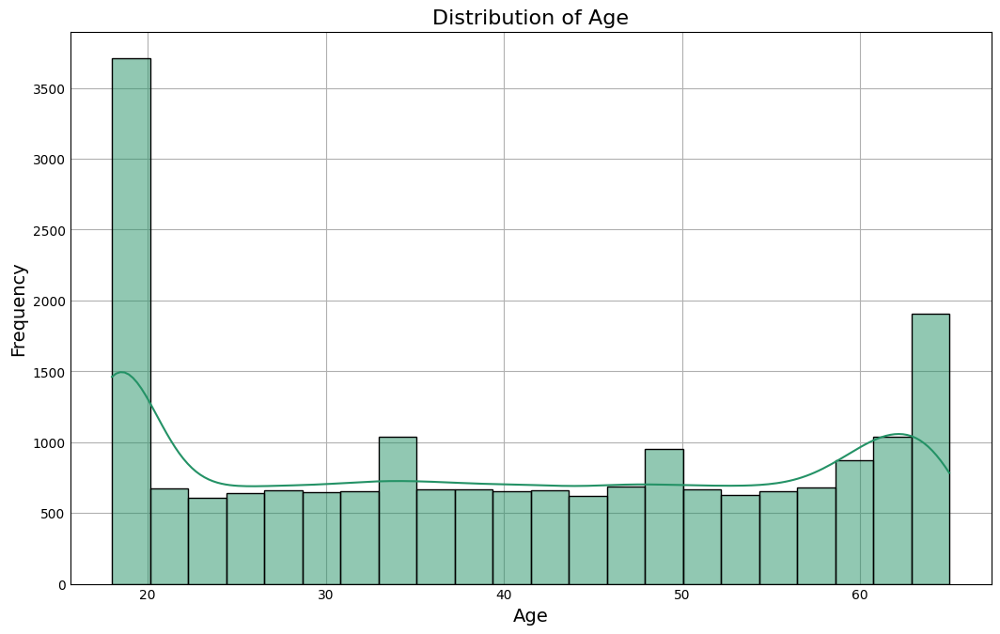

In [16]:
# Specify the column name you want to plot
column_to_plot = 'Age'  # Change this to the desired column name

# Set the color palette
sns.set_palette('summer')

# Plot the distribution of the specified column
plt.figure(figsize=(10, 6))
sns.histplot(df[column_to_plot], kde=True)
plt.title(f'Distribution of {column_to_plot}', fontsize=16)
plt.xlabel(column_to_plot, fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

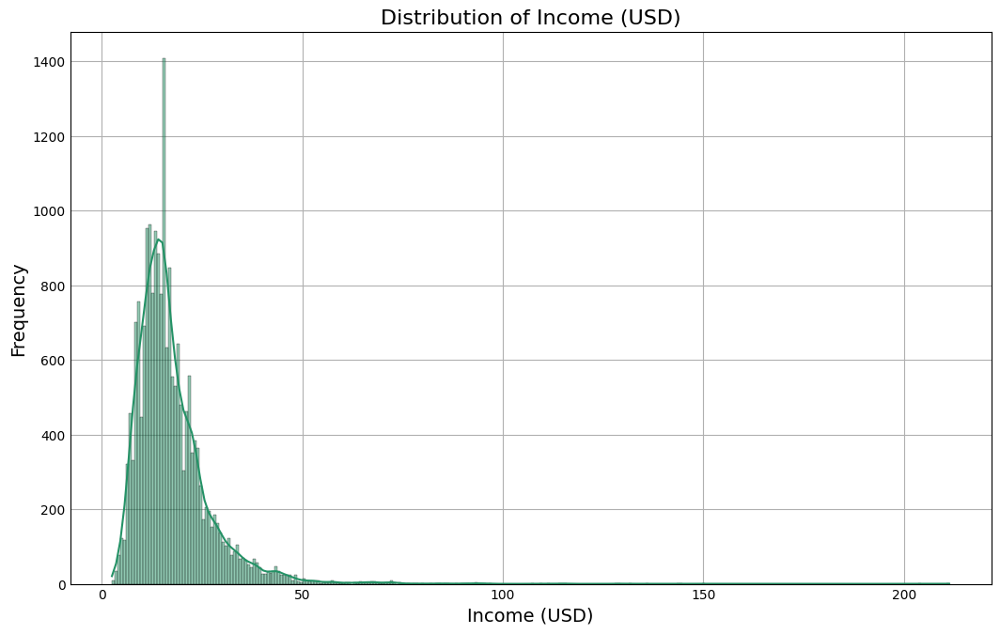

In [17]:
# Specify the column name you want to plot
column_to_plot = 'Income (USD)'  # Change this to the desired column name

# Set the color palette
sns.set_palette('summer')

# Plot the distribution of the specified column
plt.figure(figsize=(10, 6))
sns.histplot(df[column_to_plot], kde=True)
plt.title(f'Distribution of {column_to_plot}', fontsize=16)
plt.xlabel(column_to_plot, fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

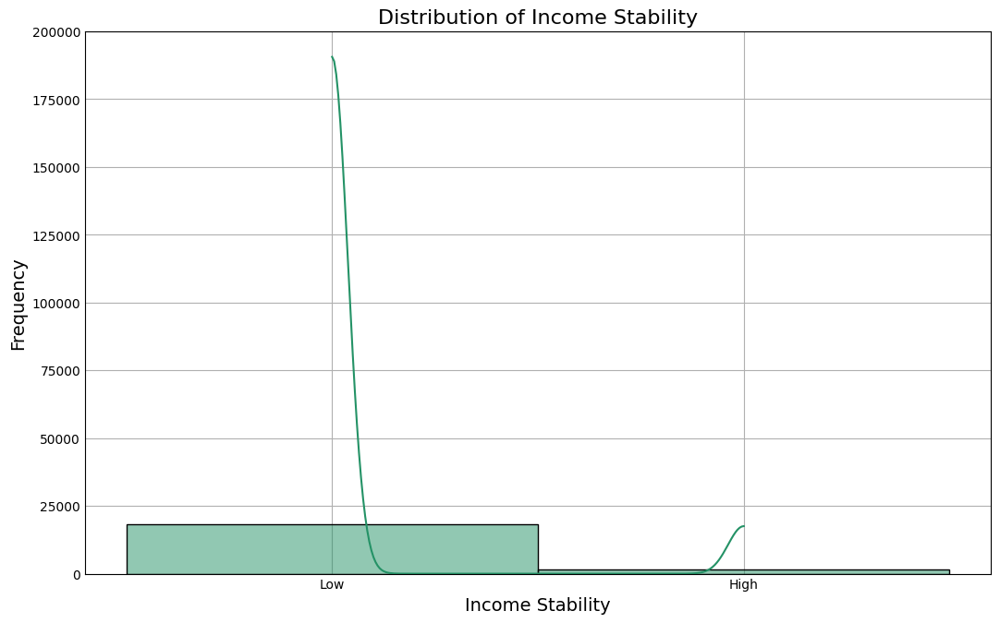

In [18]:
# Specify the column name you want to plot
column_to_plot = 'Income Stability'  # Change this to the desired column name

# Set the color palette
sns.set_palette('summer')

# Plot the distribution of the specified column
plt.figure(figsize=(10, 6))
sns.histplot(df[column_to_plot], kde=True)
plt.title(f'Distribution of {column_to_plot}', fontsize=16)
plt.xlabel(column_to_plot, fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

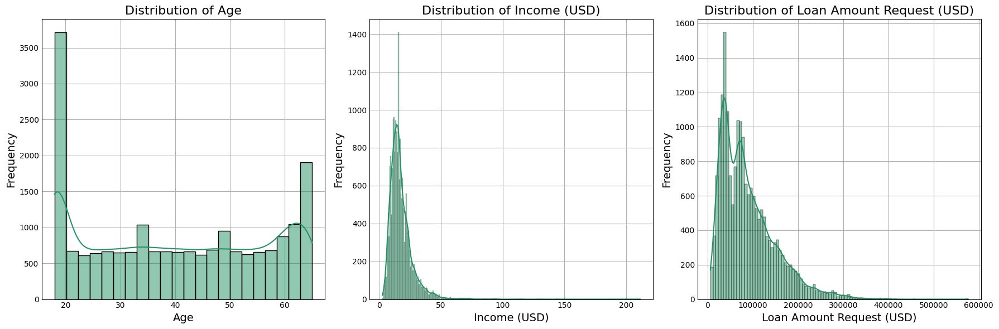

In [19]:
# Specify the column names you want to plot
columns_to_plot = ['Age', 'Income (USD)', 'Loan Amount Request (USD)']  # Change these to the desired column names

# Set the color palette
sns.set_palette('summer')

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Loop through each column and plot its distribution
for i, col in enumerate(columns_to_plot):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=16)
    axes[i].set_xlabel(col, fontsize=14)
    axes[i].set_ylabel('Frequency', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()

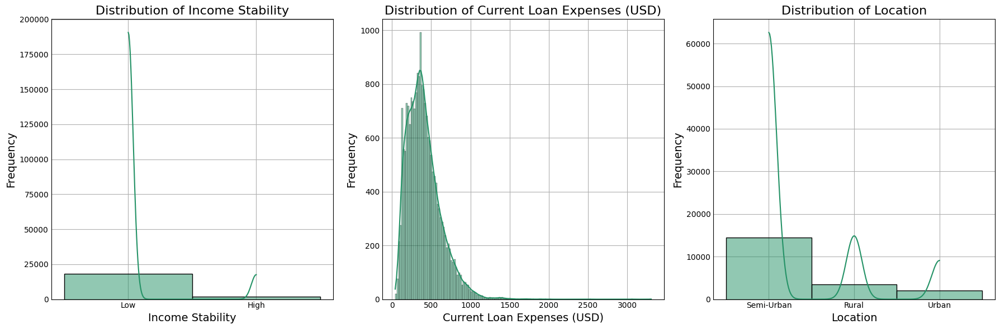

In [21]:
# Specify the column names you want to plot
columns_to_plot = ['Income Stability', 'Current Loan Expenses (USD)', 'Location']  # Change these to the desired column names

# Set the color palette
sns.set_palette('summer')

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Loop through each column and plot its distribution
for i, col in enumerate(columns_to_plot):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=16)
    axes[i].set_xlabel(col, fontsize=14)
    axes[i].set_ylabel('Frequency', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()

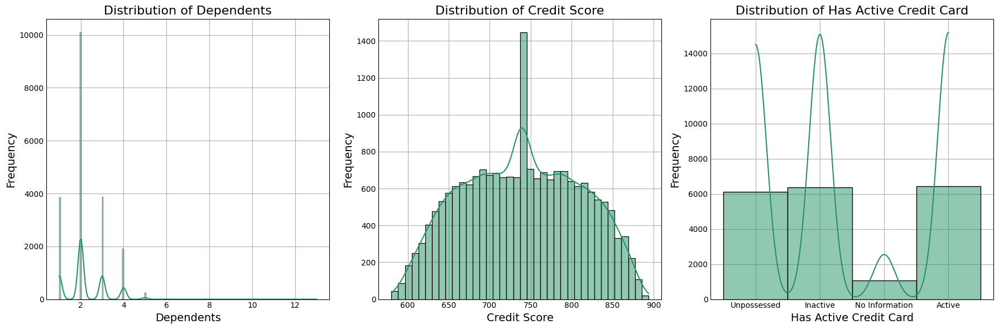

In [22]:
# Specify the column names you want to plot
columns_to_plot = ['Dependents', 'Credit Score', 'Has Active Credit Card']  # Change these to the desired column names

# Set the color palette
sns.set_palette('summer')

# Create a figure with subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Loop through each column and plot its distribution
for i, col in enumerate(columns_to_plot):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontsize=16)
    axes[i].set_xlabel(col, fontsize=14)
    axes[i].set_ylabel('Frequency', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()

In [23]:
# Check if 'Property Age' column exists and convert it to years
if 'Property Age' in df.columns:
    df['Property Age (years)'] = df['Property Age'] / 365.25

# Display the updated DataFrame with the converted column
print(df[['Property Age', 'Property Age (years)']].head())

   Property Age  Property Age (years)
0       3472.69              9.507707
1       1184.84              3.243915
2       1266.27              3.466858
3       1369.72              3.750089
4       1939.23              5.309322


In [24]:
# Convert 'Property Age' from days to years
df['Property Age (years)'] = df['Property Age'] / 365.25

# Display the updated DataFrame
print(df)

      Customer ID              Name Gender  Age  Income (USD)  \
0         C-26247  Tandra Olszewski      F   47         24.12   
1         C-35067     Jeannette Cha      F   57          8.23   
2         C-34590      Keva Godfrey      F   52          8.79   
3         C-16668      Elva Sackett      M   65          9.51   
4         C-12196    Sade Constable      F   60         13.47   
...           ...               ...    ...  ...           ...   
19995      C-9076    Tobias Davilla      F   19          9.37   
19996     C-17587    Evelina Hodges      M   22         14.03   
19997     C-46479   Karlyn Mckinzie      M   19         15.64   
19998      C-3099    Mariana Pulver      F   21         12.82   
19999     C-43482   Mechelle Boddie      M   21         36.34   

      Income Stability            Profession Type of Employment    Location  \
0                  Low  Commercial associate           Managers  Semi-Urban   
1                  Low               Working        Sales sta

In [26]:
# convert annual income to monthly with divide by 12
df['Property Age'] = round(df['Property Age']/365.25, 2)
df


,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),...,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Dependents_zscore,Property Age_zscore,Credit_Score_zscore,current_loan_expenses_zscore,Property Age (years)
0,C-26247,Tandra Olszewski,F,47,24.12,Low,Commercial associate,Managers,Semi-Urban,137088.98,...,9.51,2,Urban,1,236644.5,0.255453,0.691140,0.833053,0.054401,9.507707
1,C-35067,Jeannette Cha,F,57,8.23,Low,Working,Sales staff,Rural,104771.59,...,3.24,1,Rural,1,142357.3,0.255453,0.968816,1.304972,0.256190,3.243915
2,C-34590,Keva Godfrey,F,52,8.79,Low,Working,Other,Semi-Urban,176684.91,...,3.47,1,Urban,1,300991.24,0.822862,0.909734,1.538281,0.392351,3.466858
3,C-16668,Elva Sackett,M,65,9.51,High,Pensioner,Other,Rural,97009.18,...,3.75,1,Semi-Urban,0,125612.1,0.255453,0.834676,1.303453,0.174604,3.750089
4,C-12196,Sade Constable,F,60,13.47,High,Pensioner,Other,Urban,109980.00,...,5.31,4,Semi-Urban,1,180908,0.255453,0.421466,NaN,0.177730,5.309322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,C-9076,Tobias Davilla,F,19,9.37,Low,Commercial associate,Other,Semi-Urban,156766.97,...,3.70,4,Semi-Urban,1,212778,1.901176,0.849274,0.752716,0.426820,3.695003
19996,C-17587,Evelina Hodges,M,22,14.03,Low,Working,Core staff,Urban,47924.80,...,5.53,4,Urban,1,90816.95,0.255453,0.363023,0.448600,0.766481,5.529856
19997,C-46479,Karlyn Mckinzie,M,19,15.64,Low,Working,Core staff,Semi-Urban,18629.88,...,6.17,2,Rural,0,21566.27,1.333767,0.194513,1.137488,1.420372,6.165722
19998,C-3099,Mariana Pulver,F,21,12.82,Low,Working,Other,Semi-Urban,95430.73,...,5.05,1,Semi-Urban,1,120281.17,0.255453,0.489581,1.748993,0.635416,5.052293
